In [1]:
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns

from pandas import set_option
# set_option("display.max_rows", 10)
pd.options.mode.chained_assignment = None

###### Import packages needed for the make_vars functions

filename = 'data/facies_vectors.csv'
training_data = pd.read_csv(filename)
training_data.head()

,Facies,Formation,Well Name,Depth,GR,ILD_log10,DeltaPHI,PHIND,PE,NM_M,RELPOS
0,3,A1 SH,SHRIMPLIN,2793.0,77.45,0.664,9.9,11.915,4.6,1,1.000
1,3,A1 SH,SHRIMPLIN,2793.5,78.26,0.661,14.2,12.565,4.1,1,0.979
2,3,A1 SH,SHRIMPLIN,2794.0,79.05,0.658,14.8,13.050,3.6,1,0.957
3,3,A1 SH,SHRIMPLIN,2794.5,86.10,0.655,13.9,13.115,3.5,1,0.936
4,3,A1 SH,SHRIMPLIN,2795.0,74.58,0.647,13.5,13.300,3.4,1,0.915


In [2]:
def make_moving_av_vars(wells_df,logs,windows):
    
    new_df = pd.DataFrame()
    grouped = wells_df.groupby(['Well Name'])

    for key in grouped.groups.keys():

        temp_df = pd.DataFrame()
        temp_df['Depth'] = grouped.get_group(key)['Depth']
        
        for log in logs:

            temp_data = grouped.get_group(key)[log]
            
            for window in windows:
                temp_df[log + '_moving_av_' + str(window) + 'ft'] = pd.rolling_mean(arg=temp_data, window=window, min_periods=1, center=True)                
                
        temp_df['Well Name'] = [key for _ in range(len(temp_df['Depth']))]
        new_df = new_df.append(temp_df) 

        
    new_df = new_df.sort_index()
    new_df = new_df.drop(['Well Name','Depth'],axis=1)
    wells_df = wells_df[['Facies', 'Formation', 'Well Name', 'Depth']]
    return pd.concat([wells_df,new_df],axis=1)

In [3]:
##### From moving average
moving_av_df = make_moving_av_vars(wells_df=training_data, logs=['GR', 'ILD_log10', 'DeltaPHI', 'PE', 'PHIND'], windows=[1, 2, 5, 10, 20])
print (moving_av_df.shape)
moving_av_df.head(5)

(4149, 29)


,Facies,Formation,Well Name,Depth,GR_moving_av_1ft,GR_moving_av_2ft,GR_moving_av_5ft,GR_moving_av_10ft,GR_moving_av_20ft,ILD_log10_moving_av_1ft,...,PE_moving_av_1ft,PE_moving_av_2ft,PE_moving_av_5ft,PE_moving_av_10ft,PE_moving_av_20ft,PHIND_moving_av_1ft,PHIND_moving_av_2ft,PHIND_moving_av_5ft,PHIND_moving_av_10ft,PHIND_moving_av_20ft
0,3,A1 SH,SHRIMPLIN,2793.0,77.45,77.450,78.253333,79.088000,76.946000,0.664,...,4.6,4.60,4.10,3.840000,3.690000,11.915,11.9150,12.51000,12.789000,13.338000
1,3,A1 SH,SHRIMPLIN,2793.5,78.26,77.855,80.215000,78.235000,76.870000,0.661,...,4.1,4.35,3.95,3.800000,3.681818,12.565,12.2400,12.66125,12.888333,13.341364
2,3,A1 SH,SHRIMPLIN,2794.0,79.05,78.655,79.088000,77.590000,76.710000,0.658,...,3.6,3.85,3.84,3.785714,3.683333,13.050,12.8075,12.78900,13.037143,13.287083
3,3,A1 SH,SHRIMPLIN,2794.5,86.10,82.575,78.392000,77.347500,76.337692,0.655,...,3.5,3.55,3.64,3.750000,3.669231,13.115,13.0825,13.08300,13.147500,13.224615
4,3,A1 SH,SHRIMPLIN,2795.0,74.58,80.340,77.484000,76.952222,76.843571,0.647,...,3.4,3.45,3.56,3.711111,3.650000,13.300,13.2075,13.35600,13.240000,13.346429


In [4]:
####### Creating dictionary of colours for the different facies
facies_colors = {1:'#F4D03F', 2:'#F5B041',3:'#DC7633',4:'#6E2C00',
       5:'#1B4F72',6:'#2E86C1', 7:'#AED6F1', 8:'#A569BD', 9:'#196F3D'}
facies_name = {1:'SS', 2:'CSiS',3:'FSiS',4:'SiSh', 5:'MS',6:'WS', 7:'D', 8:'PS', 9:'BS'}

flatui = ['#F4D03F', '#F5B041', '#DC7633', '#6E2C00',
       '#1B4F72', '#2E86C1', '#AED6F1', '#A569BD', '#196F3D']

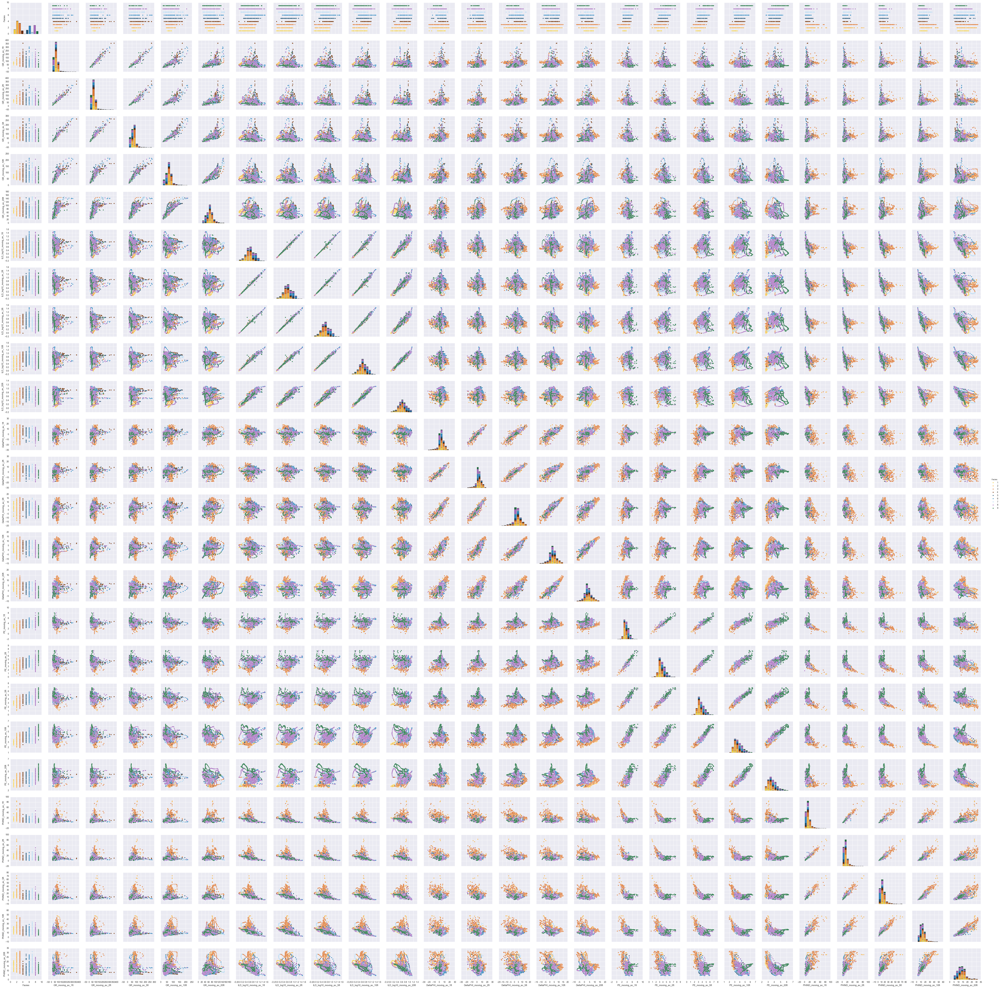

In [6]:
sns.set()
temp_df = moving_av_df
temp_df = temp_df.drop(['Formation', 'Well Name', 'Depth'], axis=1)
temp_df.dropna(inplace=True)
sns.pairplot(temp_df, hue='Facies', palette = flatui)

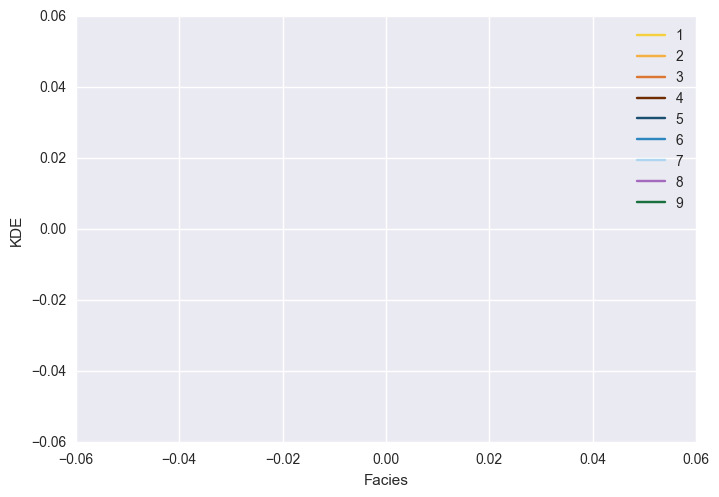

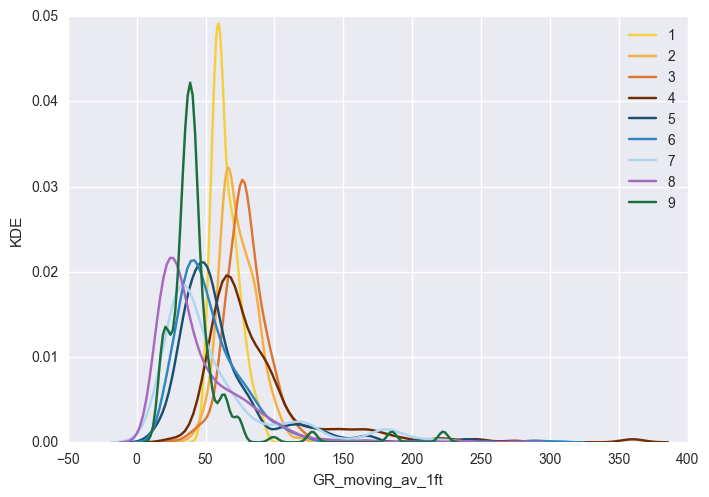

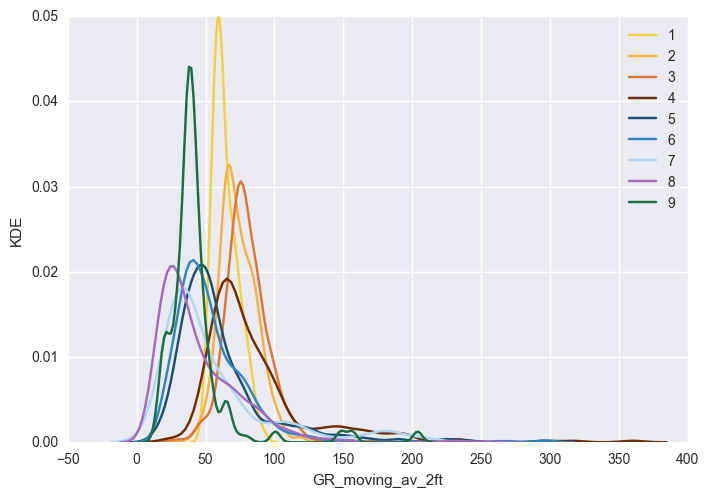

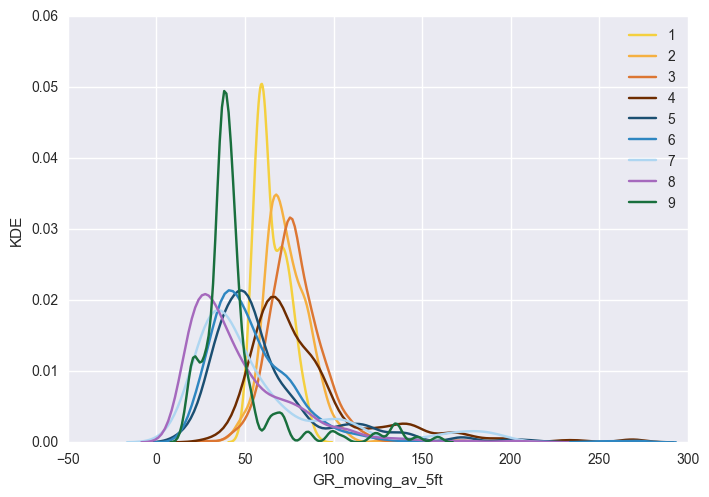

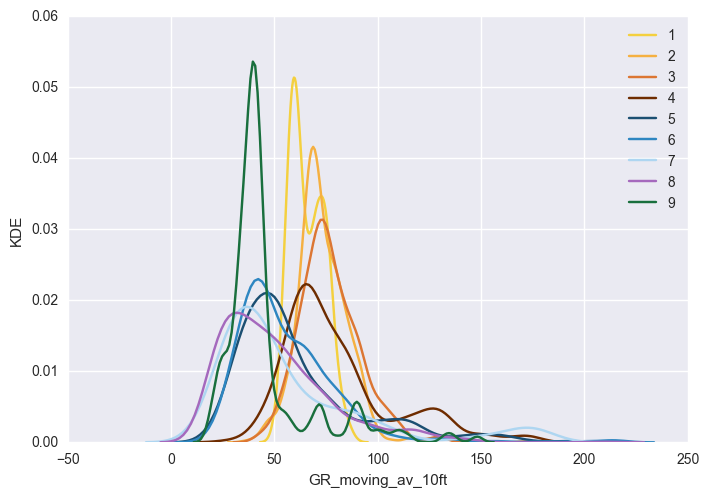

...

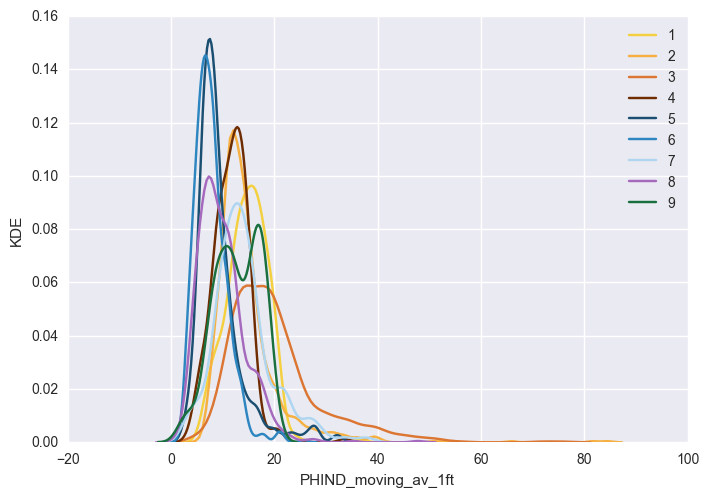

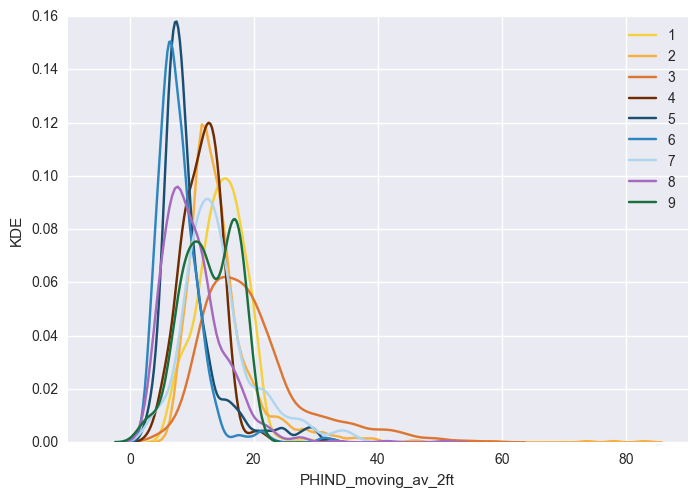

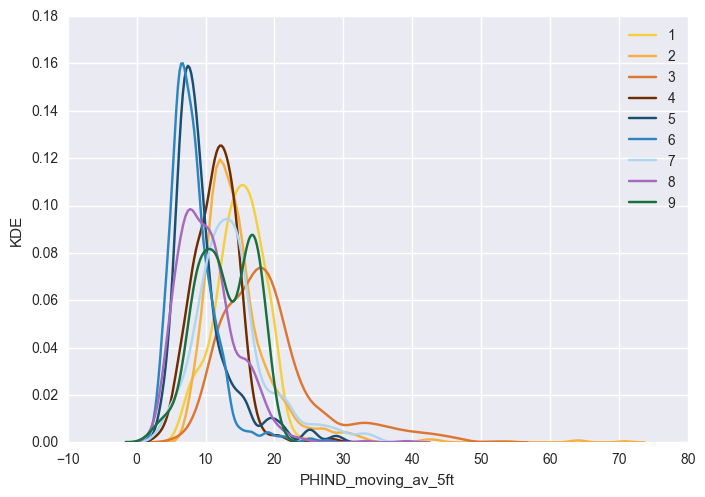

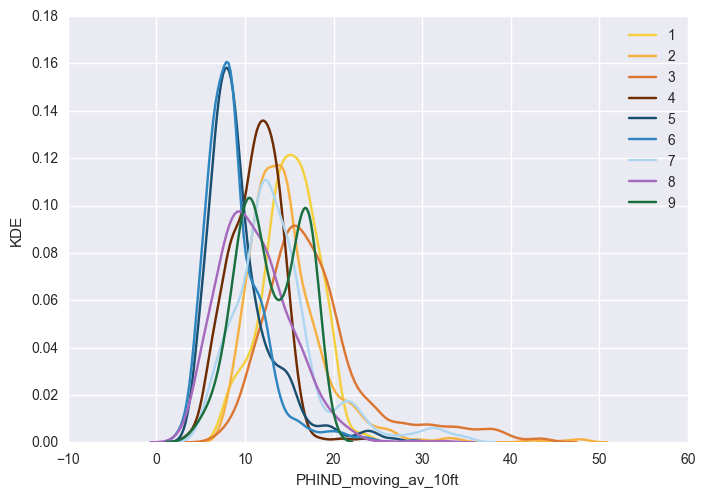

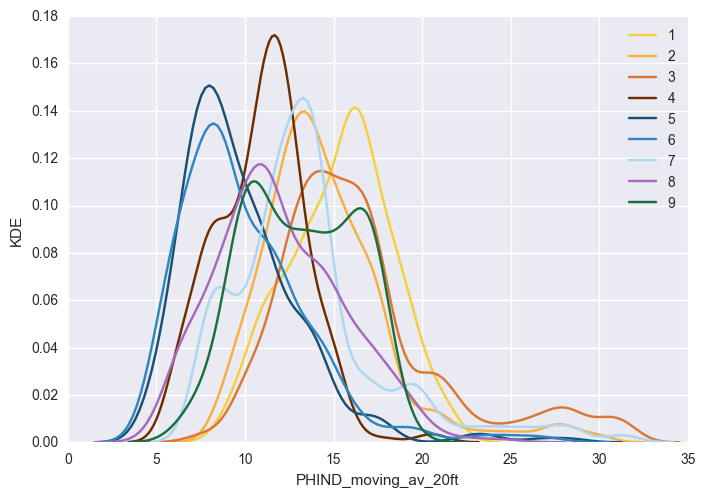

In [8]:
sns.set_palette(flatui)
list_variables = list(moving_av_df.columns.values)
list_variables.remove('Formation')
list_variables.remove('Well Name')
list_variables.remove('Depth')
#list_variables = ['GR_cD_step_level_1', 'GR_cA_step_level_1', 'GR_cD_step_level_2', 'GR_cA_step_level_2', 'GR_cD_step_level_3', 'GR_cA_step_level_3']
for a in list_variables:
    for i in np.arange(1, 10, 1):
        sns.kdeplot(moving_av_df[a][moving_av_df['Facies'] == i], label=i)
    plt.xlabel(a)
    plt.ylabel('KDE')
    plt.show()